# This is the notebook explaining the outputs and analysis of the Flint-inspired Agent-Based Model

The model has 6 versions:
- a parameter sweep on model without organizing and static trust
- a model that adds in organizing behavior to the simple version
- a model that adds dynamic trust to the organizing behavior
- the first simple model wtih media connections added
- a model that has static trust, media connections, and organizing behavior
- a model that has dynamic trust, media connections, and organizing behavior

In [33]:
#install packages

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import csv
import pandas as pd
import re
import array as arr
from scipy.stats import pearsonr

## Google trends data interpretation

[0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 1, 3, 1, 1, 1, 1, 1, 1, 0, 0, 0, 4, 3, 2, 9, 23, 100, 57, 38, 27, 14, 12, 13, 19, 15, 9, 7, 7, 7, 11, 9, 9, 6, 5, 3, 3, 3, 3, 3, 3]


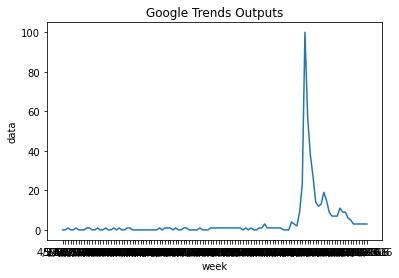

In [34]:
google_trends = pd.read_csv('google-trends.csv')
google_trends.columns = ['week', 'data']
google_data = google_trends['data'].to_list()
print(google_data)
sns.lineplot(data=google_trends, x='week', y='data')
plt.title('Google Trends Outputs')
plt.show()

#peak-time = 91
#total-spread = unknown
#r = 1
#total error = 0 
#1-week = 77, time = 91
#2-week =91, time = 91
#3-week = 98, time = 91
#4-week = 97, time = 91
#5-week = 96, time = 91


## Model 1: influence model

### Task 1: Interpret outcomes from csv output 

In [35]:
#load in the csv file
infl_mod = pd.read_csv('static-influence-sweep.csv')
infl_mod.columns = ['run', 'n', 'spread-type', 'simple-spread-chance', 'graph-type', 'ba-m', 'cit-media-influence',
                  'cit-cit--influence','repetition', 'data']


In [36]:
#process the csv and add columns to fill with metrics later

#short list represents both the shortened list to match the google trends data (114 weeks) and the processed data so that it
#is scaled out of 100 to better align with google data
infl_mod["short list"]=None
#threshold is a binary value representing whether or not the critical mass of the population has been reached (represented by
# 70%)
infl_mod['threshold'] = None
#peak-time is the time at which the peak will occur
infl_mod['peak-time']=None
#total spread is how many agents were reached in sum 
infl_mod['total-spread']=None
#n-week-spread is the largest increase in new agents over a n-week period
infl_mod['1-week-spread']=None
infl_mod['2-week-spread']=None
infl_mod['3-week-spread']=None
infl_mod['4-week-spread']=None
infl_mod['5-week-spread']=None
infl_mod['210-thresh'] = None
#total-error is the total error
infl_mod['total-error']=None
#r is caluclated as pearson's r
infl_mod['r']= None


'''The three functions below are needed for data processing'''

def convertdata(data):
    sdata = data.strip(' ')
    ndata = nlogo_parse_chunk(sdata)
    n2data = [elem.replace('.', '') for elem in ndata]
    list=[]
    for x in n2data:
        list.append(x.replace("\r\n", ""))
    list = [i for i in list if i]
    return list

def nlogo_parse_chunk(chunk):
    chunk = chunk.strip().replace('"','')
    if chunk.count('[') > 1 and chunk[0] == '[':
        return nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip())
    elif chunk.count('[') > 1 or chunk[0] != '[':
        return { chunk[0:chunk.index('[')].strip(): nlogo_mixed_list_to_dict_rec(chunk[chunk.index('['):].strip()) }

    pieces = chunk.strip().replace('[','').replace(']','').split(' ')
    if len(pieces) == 2:
        return { pieces[0]: pieces[1] }
    else:
        return pieces

def convert_to_int(data):
    for i in range(0, len(data)):
        data[i] = int(data[i])
    return data



'''This section goes through each simulation to update the dataframe with usable data and the metrics set up above'''
for i in range(0,infl_mod.shape[0]):
    thresh=0
    error=0
    delta_max_1=0
    delta_max_2=0
    delta_max_3=0
    delta_max_4=0
    delta_max_5=0
    
    #set cutoff to the number of agents that need to hear about Flint to be considered a success- for this model, total runs are 
    #500 agents, so 350 represents 70% of them
    cutoff=350
    
    run1 = infl_mod["data"].iloc[i]
    finallist = convertdata(run1)
    int_data = convert_to_int(finallist)
    short_list=int_data[: 114]
    scaled_short_list=[]
        #code below scales data from 0-100 to match google trends- this is needed to calculate total error, pearson's r, etc
    if max(short_list)>= 1:
        for k in range(0, len(short_list)):
            val=(short_list[k]/max(short_list))*100
            scaled_short_list.append(val)
        time_of_peak=short_list.index(max(short_list))
    else:
        for k in range(0, len(short_list)):
            val = (short_list[k] / 1) * 100
            scaled_short_list.append(val)
    infl_mod['short list'].iloc[i] = scaled_short_list
    for h in range(0, len(scaled_short_list)):
        thresh=thresh+int_data[h]
        error_addition=abs(scaled_short_list[h]-google_data[h])
        error=error+error_addition
    #since thresh is untransformed, we tabulate off of raw data cut to 114 weeks, not the scaled 0-100 data
    infl_mod['total-spread'].iloc[i] = thresh
    #if thresh >= ((300 + num-media) * 0.7):
    if thresh >= cutoff:
        infl_mod['threshold'].iloc[i] = 1
    else:
        infl_mod['threshold'].iloc[i] = 0
    if thresh >= 210:
        infl_mod['210-thresh'].iloc[i] = 1
    else:
        infl_mod['210-thresh'].iloc[i] = 0
    for a in range(1, len(scaled_short_list)):
        delta_1 = scaled_short_list[a] - scaled_short_list[a-1]
        if delta_1 > delta_max_1:
            delta_max_1 = delta_1
        else:
            pass
    for j in range(2, len(scaled_short_list)):
        delta_2 = scaled_short_list[j] - scaled_short_list[j-2]
        if delta_2 > delta_max_2:
            delta_max_2 = delta_2
        else:
            pass
    for b in range(3, len(scaled_short_list)):
        delta_3 = scaled_short_list[b] - scaled_short_list[b-3]
        if delta_3 > delta_max_3:
            delta_max_3 = delta_3
        else:
            pass
    for c in range(4, len(scaled_short_list)):
        delta_4 = scaled_short_list[c] - scaled_short_list[c-4]
        if delta_4 > delta_max_4:
            delta_max_4 = delta_4
        else:
            pass
    for d in range(5, len(scaled_short_list)):
        delta_5 = scaled_short_list[d] - scaled_short_list[d-5]
        if delta_5 > delta_max_5:
            delta_max_5 = delta_5
        else:
            pass
    
    
    corr_coef=pearsonr(google_data,scaled_short_list)
    corr_val=corr_coef[0]
    infl_mod['r'].iloc[i] = corr_val
    infl_mod["total-error"].iloc[i]=error
    infl_mod['peak-time'].iloc[i]=time_of_peak
    infl_mod['1-week-spread'].iloc[i] = delta_max_1
    infl_mod['2-week-spread'].iloc[i] = delta_max_2
    infl_mod['3-week-spread'].iloc[i] = delta_max_3
    infl_mod['4-week-spread'].iloc[i] = delta_max_4
    infl_mod['5-week-spread'].iloc[i] = delta_max_5
        #2-week spread
    if i % 5000 == 0:
        print(i)

infl_mod.to_csv('influence_mod_with_metrics.csv')


 

     

C:\Users\cknox02\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
C:\Users\cknox02\Anaconda3\lib\site-packages\scipy\stats\stats.py:4023: PearsonRConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  warnings.warn(PearsonRConstantInputWarning())


0
5000
10000
15000
20000
25000
30000
35000
40000
45000
50000
55000
60000


## Task 2: Analysis
Now that our metrics have been calculated, we will use the next section to explore the outcomes....



Question 1: How do the parameters and metrics vary across the total runs?

C:\Users\cknox02\Anaconda3\lib\site-packages\numpy\lib\histograms.py:837: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\cknox02\Anaconda3\lib\site-packages\numpy\lib\histograms.py:838: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


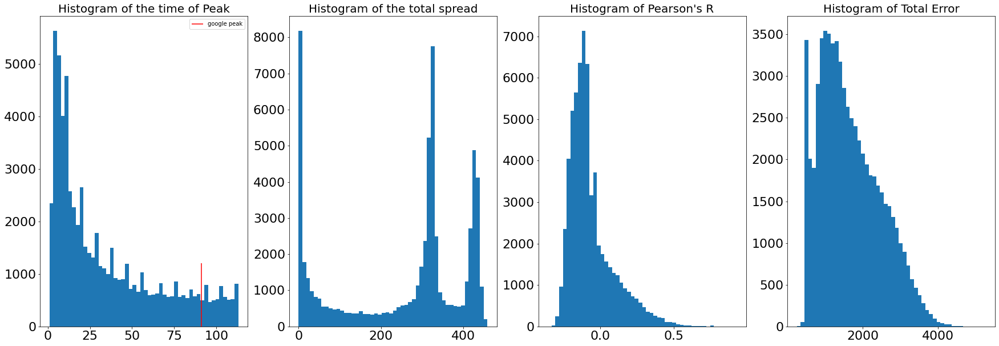

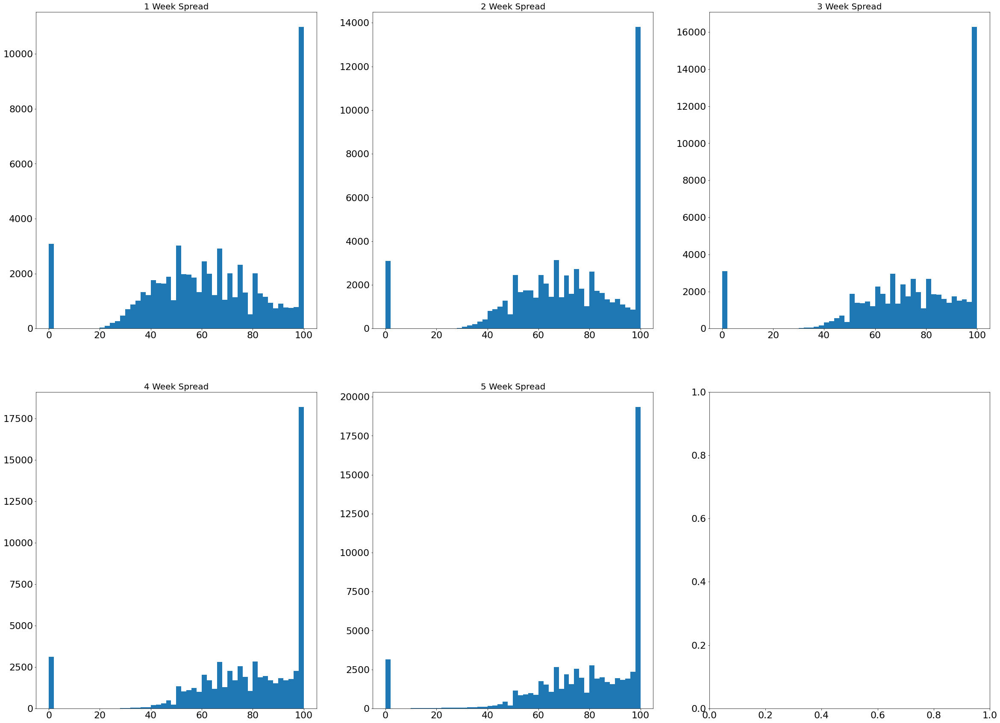

In [37]:
'''WHAT ARE THE RANGES OF EACH OF OUR METRICS?'''
#Note: this analysis uses all simulations, not limited to those that crossed the threshold. Because of this, there bin for peak
#spread = 100 is inflated, because this includes runs that went something like [0,0,0,0,1,0,0,0]



figure, axis = plt.subplots(1, 4, figsize= (30,10))

# For peak time
axis[0].hist(infl_mod['peak-time'], bins=50)
axis[0].vlines(91, 0, 1200, color = 'red', label = 'google peak')
axis[0].set_title("Histogram of the time of Peak", size=20)
axis[0].legend()
axis[0].tick_params(axis='both', which='major', labelsize=22)
  
# For total-spread
axis[1].hist(infl_mod['total-spread'], bins=50)
axis[1].set_title("Histogram of the total spread", size=20)
axis[1].tick_params(axis='both', which='major', labelsize=22)

# For pearson's r
axis[2].hist(infl_mod['r'], bins=50)
axis[2].set_title("Histogram of Pearson's R", size=20)
axis[2].tick_params(axis='both', which='major', labelsize=22)

# For total error
axis[3].hist(infl_mod['total-error'], bins=50)
axis[3].set_title("Histogram of Total Error", size=20)
axis[3].tick_params(axis='both', which='major', labelsize=22)
  
# Combine all the operations and display
plt.show()


figure, axis = plt.subplots(2, 3, figsize= (40,30))
plt.tick_params(axis='both', which='major', labelsize=22)
# For 1-week-spread
axis[0,0].hist(infl_mod['1-week-spread'], bins=50)
axis[0,0].set_title("1 Week Spread", size=20)
axis[0,0].tick_params(axis='both', which='major', labelsize=22)

# For 2-week-spread
axis[0,1].hist(infl_mod['2-week-spread'], bins=50)
axis[0,1].set_title("2 Week Spread", size=20)
axis[0,1].tick_params(axis='both', which='major', labelsize=22)

  
# For 3-week-spread
axis[0,2].hist(infl_mod['3-week-spread'], bins=50)
axis[0,2].set_title("3 Week Spread", size=20)
axis[0,2].tick_params(axis='both', which='major', labelsize=22)


# For 4-week-spread
axis[1,0].hist(infl_mod['4-week-spread'], bins=50)
axis[1,0].set_title("4 Week Spread", size=20)
axis[1,0].tick_params(axis='both', which='major', labelsize=22)

  
    
# For 5-week-spread
axis[1,1].hist(infl_mod['5-week-spread'], bins=50)
axis[1,1].set_title("5 Week Spread", size=20)
axis[1,1].tick_params(axis='both', which='major', labelsize=22)


  
# Combine all the operations and display
plt.show()

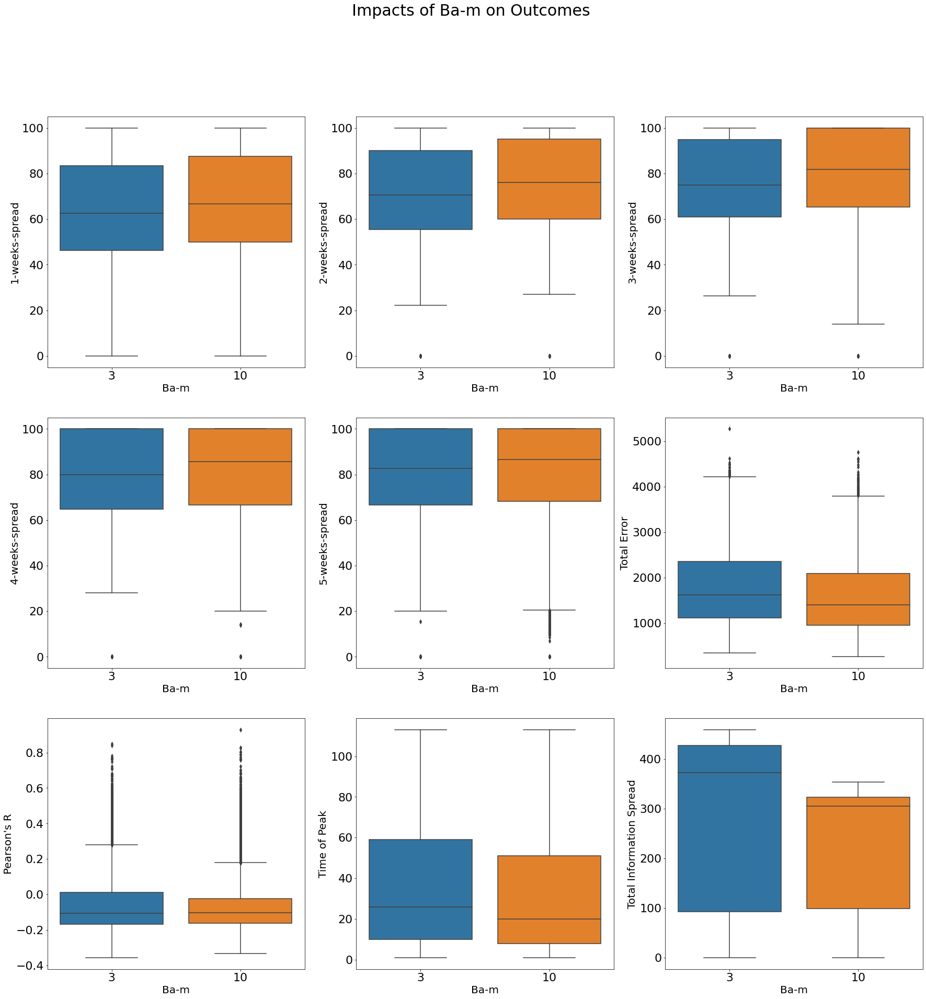

In [38]:
#Now we can explore how each parameter affected each metric

    
fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of Ba-m on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='ba-m', y='1-week-spread')
axes[0,0].set_xlabel("Ba-m", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='ba-m', y='2-week-spread')
axes[0,1].set_xlabel("Ba-m", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='ba-m', y='3-week-spread')
axes[0,2].set_xlabel("Ba-m", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='ba-m', y='4-week-spread')
axes[1,0].set_xlabel("Ba-m", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='ba-m', y='5-week-spread')
axes[1,1].set_xlabel("Ba-m", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='ba-m', y='total-error')
axes[1,2].set_xlabel("Ba-m", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='ba-m', y='r')
axes[2,0].set_xlabel("Ba-m", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='ba-m', y='peak-time')
axes[2,1].set_xlabel("Ba-m", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='ba-m', y='total-spread')
axes[2,2].set_xlabel("Ba-m", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)





Visually, we see that Ba-M has a strong impact really only on total information spread and a slight impact on time of peak. This makes sense because ba-m affects the intiial connectivity of the graph.

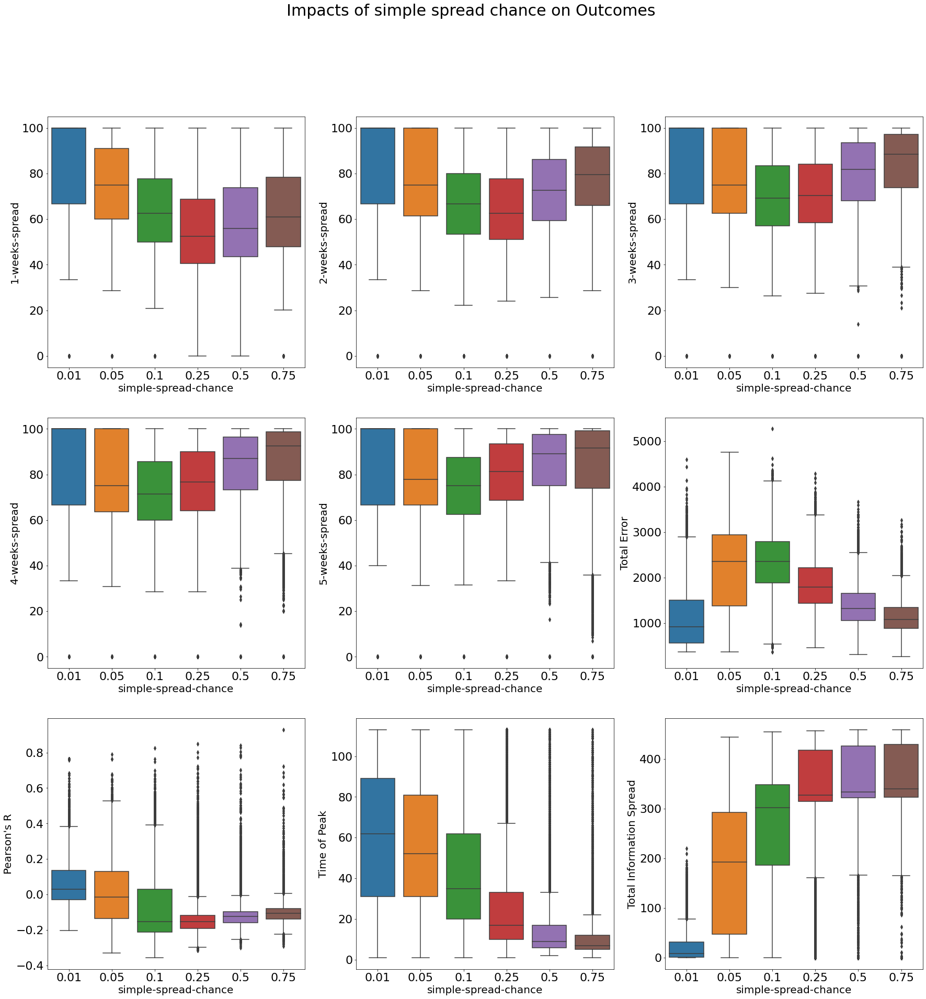

In [39]:

#simple-spread chance
fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of simple spread chance on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='simple-spread-chance', y='1-week-spread')
axes[0,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='simple-spread-chance', y='2-week-spread')
axes[0,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='simple-spread-chance', y='3-week-spread')
axes[0,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='simple-spread-chance', y='4-week-spread')
axes[1,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='simple-spread-chance', y='5-week-spread')
axes[1,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='simple-spread-chance', y='total-error')
axes[1,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='simple-spread-chance', y='r')
axes[2,0].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='simple-spread-chance', y='peak-time')
axes[2,1].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='simple-spread-chance', y='total-spread')
axes[2,2].set_xlabel("simple-spread-chance", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)

#citizen-citizen-influence


#citizen-media-influence



Here, patterns are unclear in the x-week-spread (perhaps would flatten with a larger number of runs. However, there are significant impacts due to time of peak and total spread.

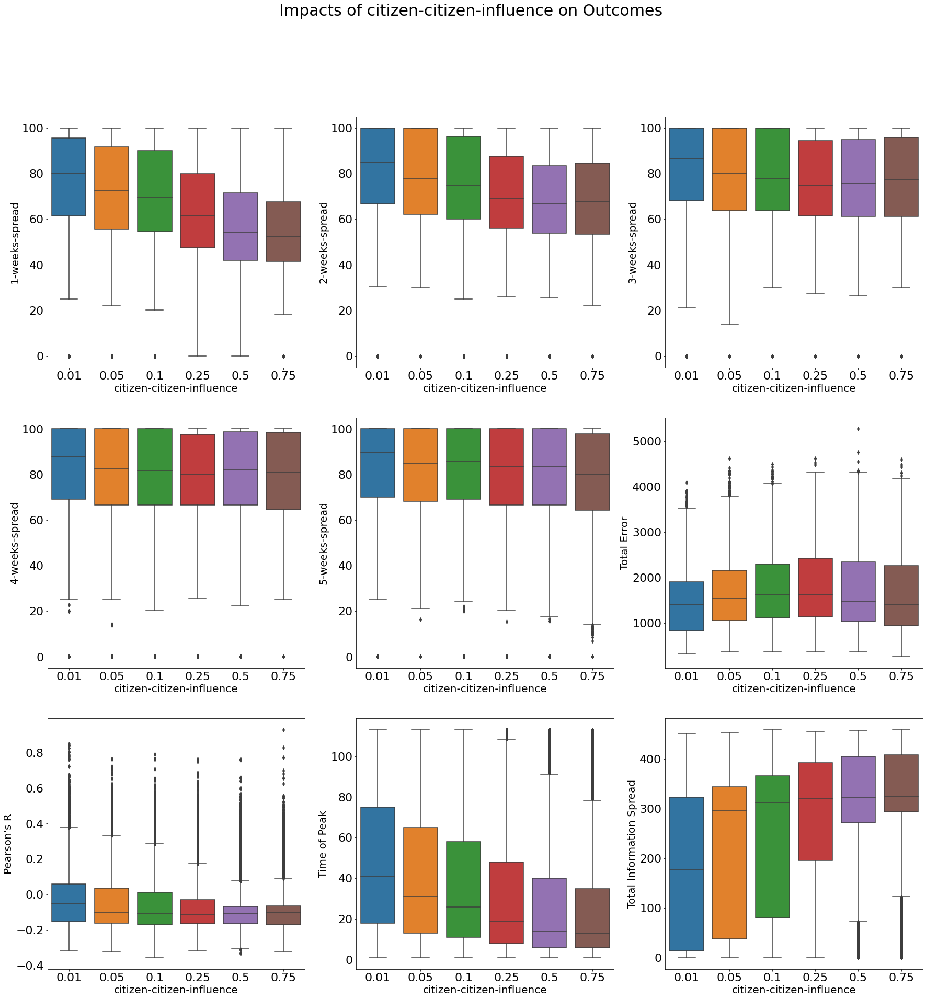

In [40]:
#citizen-citizen-influence
fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of citizen-citizen-influence on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='cit-cit--influence', y='1-week-spread')
axes[0,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='cit-cit--influence', y='2-week-spread')
axes[0,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='cit-cit--influence', y='3-week-spread')
axes[0,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='cit-cit--influence', y='4-week-spread')
axes[1,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='cit-cit--influence', y='5-week-spread')
axes[1,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='cit-cit--influence', y='total-error')
axes[1,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='cit-cit--influence', y='r')
axes[2,0].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='cit-cit--influence', y='peak-time')
axes[2,1].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='cit-cit--influence', y='total-spread')
axes[2,2].set_xlabel("citizen-citizen-influence", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)


We see the biggest impact in total information spread, but this parameter also appears to affect spread in a discernable way.

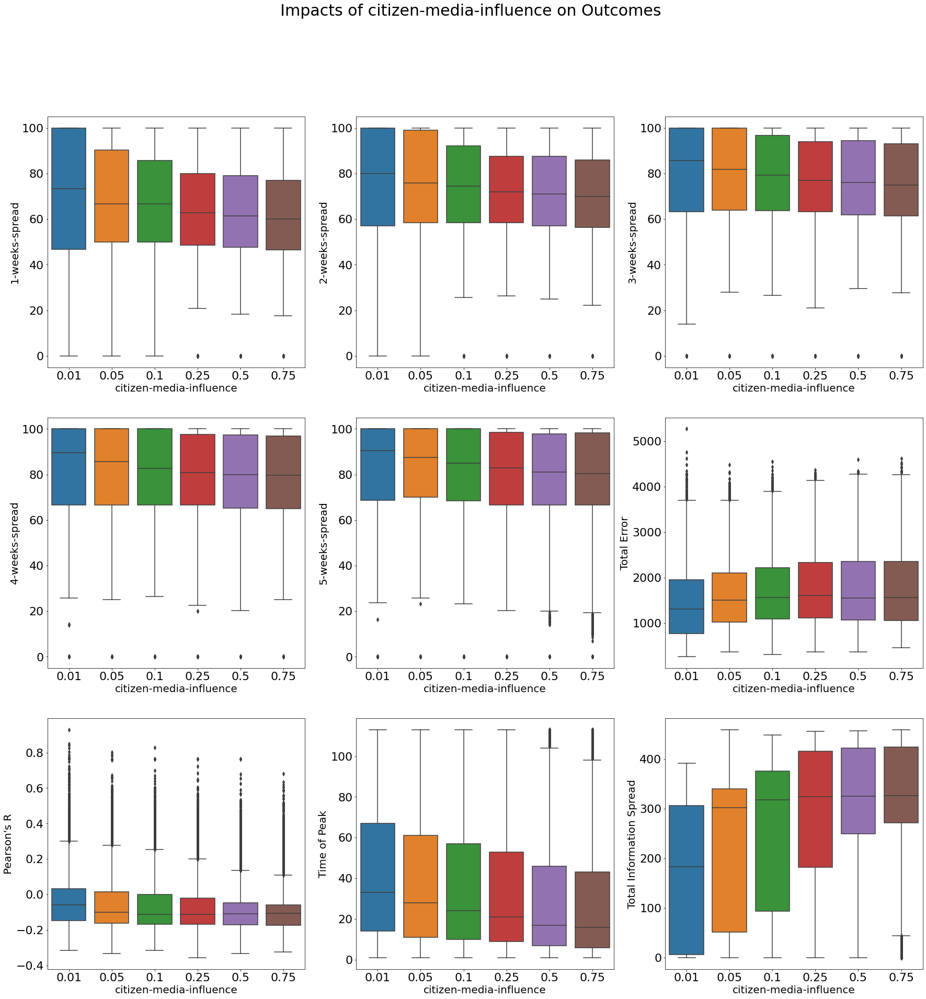

In [41]:
#citizen-media-influence
fig, axes=plt.subplots(3,3, figsize= (30,30))
fig.suptitle('Impacts of citizen-media-influence on Outcomes', fontsize=30)

sns.boxplot(ax=axes[0,0], data= infl_mod, x='cit-media-influence', y='1-week-spread')
axes[0,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,0].set_ylabel("1-weeks-spread", fontsize=20)
axes[0,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,1], data= infl_mod, x='cit-media-influence', y='2-week-spread')
axes[0,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,1].set_ylabel("2-weeks-spread", fontsize=20)
axes[0,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[0,2], data= infl_mod, x='cit-media-influence', y='3-week-spread')
axes[0,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[0,2].set_ylabel("3-weeks-spread", fontsize=20)
axes[0,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,0], data= infl_mod, x='cit-media-influence', y='4-week-spread')
axes[1,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,0].set_ylabel("4-weeks-spread", fontsize=20)
axes[1,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,1], data= infl_mod, x='cit-media-influence', y='5-week-spread')
axes[1,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,1].set_ylabel("5-weeks-spread", fontsize=20)
axes[1,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[1,2], data= infl_mod, x='cit-media-influence', y='total-error')
axes[1,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[1,2].set_ylabel("Total Error", fontsize=20)
axes[1,2].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,0], data= infl_mod, x='cit-media-influence', y='r')
axes[2,0].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,0].set_ylabel("Pearson's R", fontsize=20)
axes[2,0].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,1], data= infl_mod, x='cit-media-influence', y='peak-time')
axes[2,1].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,1].set_ylabel("Time of Peak", fontsize=20)
axes[2,1].tick_params(axis='both', which='major', labelsize=22)

sns.boxplot(ax=axes[2,2], data= infl_mod, x='cit-media-influence', y='total-spread')
axes[2,2].set_xlabel("citizen-media-influence", fontsize=20)
axes[2,2].set_ylabel("Total Information Spread", fontsize=20)
axes[2,2].tick_params(axis='both', which='major', labelsize=22)


Question 2: How often was our threshold reached for each combination of parameters?

     ba-m  simple-spread-chance  cit-cit--influence  cit-media-influence  \
0       3                  0.01                0.01                 0.01   
1       3                  0.01                0.01                 0.05   
2       3                  0.01                0.01                 0.10   
3       3                  0.01                0.01                 0.25   
4       3                  0.01                0.01                 0.50   
..    ...                   ...                 ...                  ...   
427    10                  0.75                0.75                 0.05   
428    10                  0.75                0.75                 0.10   
429    10                  0.75                0.75                 0.25   
430    10                  0.75                0.75                 0.50   
431    10                  0.75                0.75                 0.75   

    210-thresh  
0            0  
1            0  
2            0  
3            0  
4 

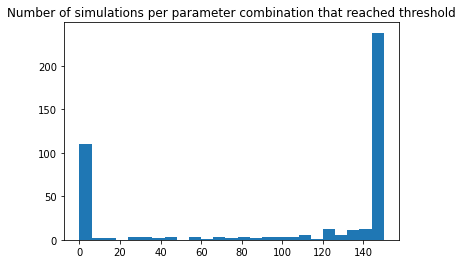

     ba-m  simple-spread-chance  cit-cit--influence  cit-media-influence  \
45      3                  0.05                0.05                 0.25   
46      3                  0.05                0.05                 0.50   
47      3                  0.05                0.05                 0.75   
51      3                  0.05                0.10                 0.25   
52      3                  0.05                0.10                 0.50   
..    ...                   ...                 ...                  ...   
427    10                  0.75                0.75                 0.05   
428    10                  0.75                0.75                 0.10   
429    10                  0.75                0.75                 0.25   
430    10                  0.75                0.75                 0.50   
431    10                  0.75                0.75                 0.75   

    210-thresh  
45          24  
46          72  
47         112  
51          67  
52

In [44]:
#in order to count the number of simulations for each parameter combination, I will sum the numebr of thresholds by matches 
#in each parameter

#each parameter combination was run 5 times on 5 graphs --> max number of runs that surpass threshold = 25

infl_mod_thresh_count=infl_mod.copy()
infl_mod_thresh_count=infl_mod_thresh_count.groupby(["ba-m", 'simple-spread-chance', 'cit-cit--influence', 'cit-media-influence'])['210-thresh'].sum().reset_index()
print(infl_mod_thresh_count)

infl_mod_thresh_count.to_csv("infl_mod_thresh_count.csv")

plt.hist(infl_mod_thresh_count["210-thresh"], bins=25)
plt.title('Number of simulations per parameter combination that reached threshold')
plt.show()

infl_mod_thresh_count=infl_mod_thresh_count.loc[infl_mod_thresh_count['210-thresh']>=20]
print(infl_mod_thresh_count)


The results above suggest that a majority of the parameters combinations do not spread to a large proportion of the population. We are interested in the cases that do. For this reason, I will select all parameter combinations that have more than 20/25 simulations reach the threshold for futher analysis. There are 113 parameter combinations that fit this. I will edit the main file to have a column about whether or not the parameter combination reached the threshold.

In [45]:
#add success/not success column

infl_mod['param-thresh']=None
for i in range(0, len(infl_mod_thresh_count)):
    ba_m_val = infl_mod_thresh_count['ba-m'].iloc[i]
    simple_spread_chance_val = infl_mod_thresh_count['simple-spread-chance'].iloc[i]
    cit_cit_in_val = infl_mod_thresh_count['cit-cit--influence'].iloc[i]
    cit_med_val = infl_mod_thresh_count['cit-media-influence'].iloc[i]
    print('next param setting',i)
    for j in range(0, len(infl_mod)):
        if infl_mod['ba-m'].iloc[j] == ba_m_val:
            if infl_mod['simple-spread-chance'].iloc[j] == simple_spread_chance_val:
                if infl_mod['cit-cit--influence'].iloc[j] == cit_cit_in_val:
                    if infl_mod['cit-media-influence'].iloc[j] == cit_med_val:
                        infl_mod['param-thresh'].iloc[j] = 1
                    else:
                        pass
                else:
                    pass
            else:
                pass
        else:
            pass

infl_mod.to_csv('infl_mod_with_param_thresh.csv')            
print(infl_mod)
    
    
    

next param setting 0


C:\Users\cknox02\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


next param setting 1
next param setting 2
next param setting 3
next param setting 4
next param setting 5
next param setting 6
next param setting 7
next param setting 8
next param setting 9
next param setting 10
next param setting 11
next param setting 12
next param setting 13
next param setting 14
next param setting 15
next param setting 16
next param setting 17
next param setting 18
next param setting 19
next param setting 20
next param setting 21
next param setting 22
next param setting 23
next param setting 24
next param setting 25
next param setting 26
next param setting 27
next param setting 28
next param setting 29
next param setting 30
next param setting 31
next param setting 32
next param setting 33
next param setting 34
next param setting 35
next param setting 36
next param setting 37
next param setting 38
next param setting 39
next param setting 40
next param setting 41
next param setting 42
next param setting 43
next param setting 44
next param setting 45
next param setting 

In [46]:
#this code will limit the dataframe to those who have passed our threshold calculations
infl_mod=infl_mod.loc[infl_mod['param-thresh'] == 1]

#infl_mod is now a dataframe of all simulations within parameter combinations where the threshold of 70% spread was passed 20/25 times
#now we can sort by the median peak-time value (the metric that best represents our question)
infl_mod_time_median=infl_mod.copy()
infl_mod_time_median=infl_mod_time_median.groupby(["ba-m", 'simple-spread-chance', 'cit-cit--influence', 'cit-media-influence'])['peak-time'].median().reset_index()
print(infl_mod_time_median)

infl_mod_time_median.to_csv("infl_mod_time_median.csv")










     ba-m  simple-spread-chance  cit-cit--influence  cit-media-influence  \
0       3                  0.05                0.05                 0.25   
1       3                  0.05                0.05                 0.50   
2       3                  0.05                0.05                 0.75   
3       3                  0.05                0.10                 0.25   
4       3                  0.05                0.10                 0.50   
..    ...                   ...                 ...                  ...   
313    10                  0.75                0.75                 0.05   
314    10                  0.75                0.75                 0.10   
315    10                  0.75                0.75                 0.25   
316    10                  0.75                0.75                 0.50   
317    10                  0.75                0.75                 0.75   

     peak-time  
0         83.0  
1         81.0  
2         81.0  
3         82.5  
4 

In [47]:
#Now I will take a look at the top hits here,  using the dataframe previously saved as a csv so we don't have to regenerate it
#this will generate the top 20 parameter combinations
df=pd.read_csv("infl_mod_with_param_thresh.csv")
#old method for this

g_data=pd.read_csv("google-trends.csv")
g_data.columns=['week', 'data']
goog_data= g_data['data'].to_list()

time_list=[]
for i in range(0, 114):
    time_list.append(i)

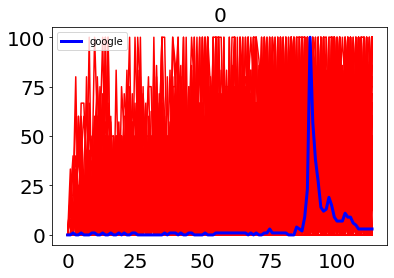

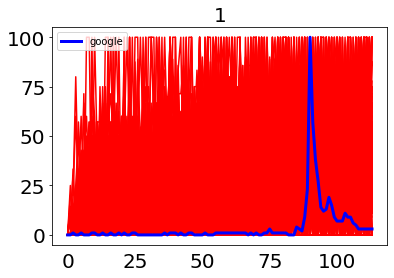

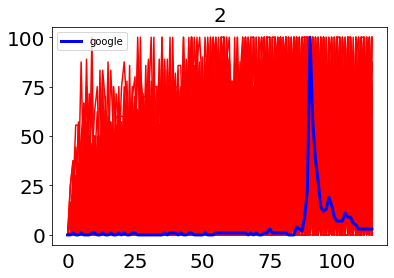

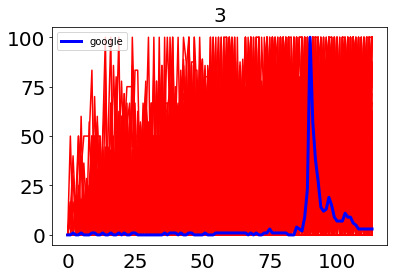

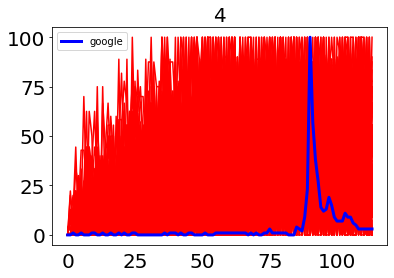

...

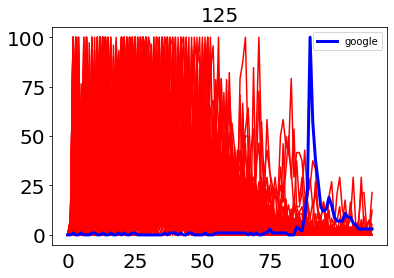

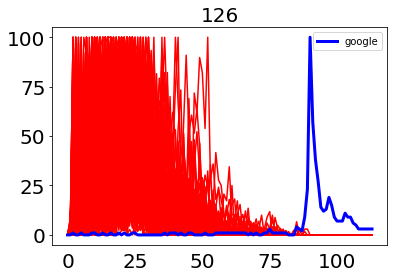

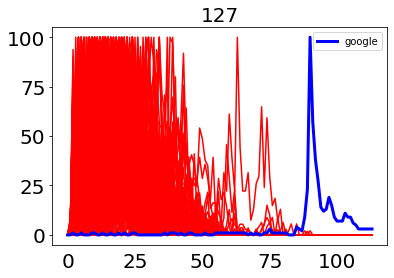

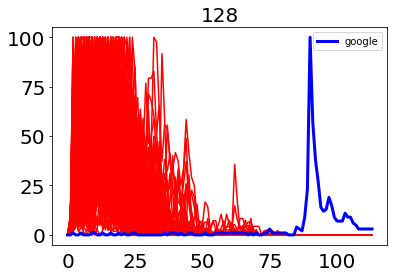

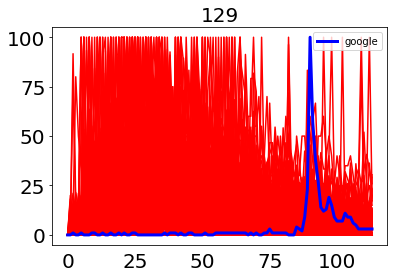

In [48]:
#all rows
infl_mod_time_median= pd.read_csv("infl_mod_time_median.csv")
for i in range(0, 130):
    ba_m_val = infl_mod_time_median['ba-m'].iloc[i]
    p_ = infl_mod_time_median['simple-spread-chance'].iloc[i]
    cit_cit = infl_mod_time_median['cit-cit--influence'].iloc[i]
    cit_media = infl_mod_time_median['cit-media-influence'].iloc[i]
    data_1= df.loc[df['ba-m']==ba_m_val]
    data_1=data_1.loc[data_1['simple-spread-chance']==p_]
    data_1=data_1.loc[data_1['cit-cit--influence']==cit_cit]
    data_1=data_1.loc[data_1['cit-media-influence']==cit_media]
    for j in range(0, len(data_1)):
        data=data_1['short list'].iloc[j]
        data_list=data.strip('][').split(', ')
        new_list=[]
        for j in range(0, len(data_list)):
            item=float(data_list[j])
            new_list.append(item)
        val=i
        plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False, labelsize=20)
        plt.plot(time_list, new_list, color='red')
    

    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i, fontsize=20)
    plt.show()

    

       Unnamed: 0    run    n spread-type  simple-spread-chance  \
13610       13610  13610  300      simple                  0.05   
13611       13611  13611  300      simple                  0.05   
13612       13612  13612  300      simple                  0.05   
13613       13613  13613  300      simple                  0.05   
13614       13614  13614  300      simple                  0.05   
...           ...    ...  ...         ...                   ...   
13755       13755  13755  300      simple                  0.05   
13756       13756  13756  300      simple                  0.05   
13757       13757  13757  300      simple                  0.05   
13758       13758  13758  300      simple                  0.05   
13759       13759  13759  300      simple                  0.05   

            graph-type  ba-m  cit-media-influence  cit-cit--influence  \
13610  barabasi-albert     3                 0.25                0.05   
13611  barabasi-albert     3                 0.25

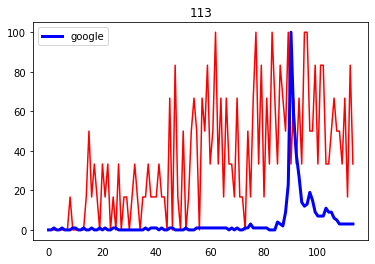

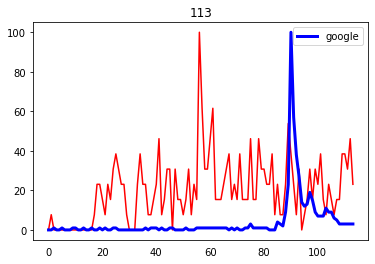

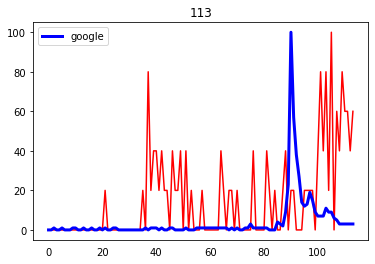

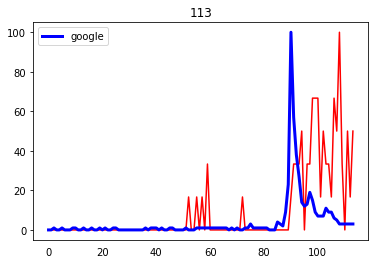

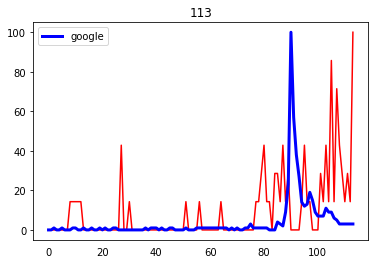

...

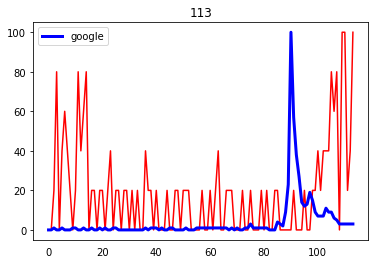

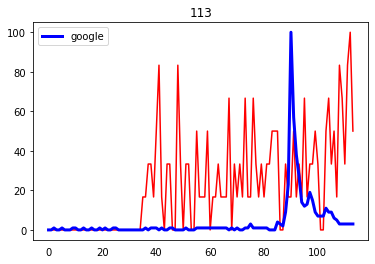

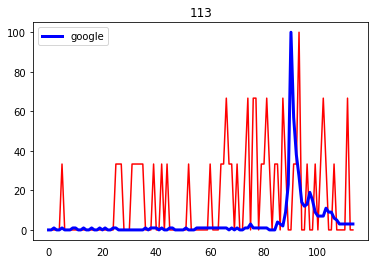

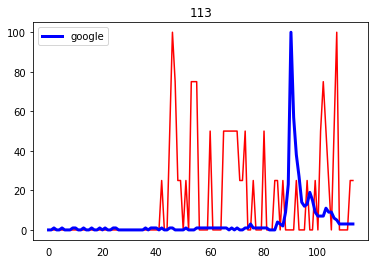

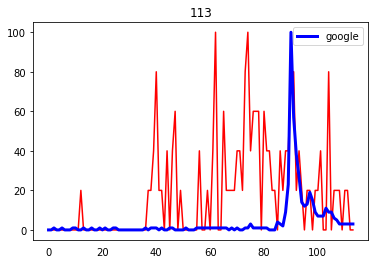

In [52]:
#lets look closer at our best results (median time = 83)

data_1= df.loc[df['ba-m']==3]
data_1=data_1.loc[data_1['simple-spread-chance']==0.05]
data_1=data_1.loc[data_1['cit-cit--influence']==0.05]
data_1=data_1.loc[data_1['cit-media-influence']==0.25]
print(data_1)

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for i in range(0, len(data_list)):
        item=float(data_list[i])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')
    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i)
    plt.show()

       Unnamed: 0    run    n spread-type  simple-spread-chance  \
13760       13760  13760  300      simple                  0.05   
13761       13761  13761  300      simple                  0.05   
13762       13762  13762  300      simple                  0.05   
13763       13763  13763  300      simple                  0.05   
13764       13764  13764  300      simple                  0.05   
...           ...    ...  ...         ...                   ...   
13905       13905  13905  300      simple                  0.05   
13906       13906  13906  300      simple                  0.05   
13907       13907  13907  300      simple                  0.05   
13908       13908  13908  300      simple                  0.05   
13909       13909  13909  300      simple                  0.05   

            graph-type  ba-m  cit-media-influence  cit-cit--influence  \
13760  barabasi-albert     3                 0.25                 0.1   
13761  barabasi-albert     3                 0.25

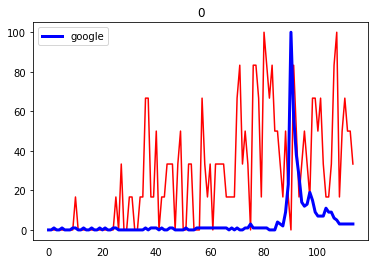

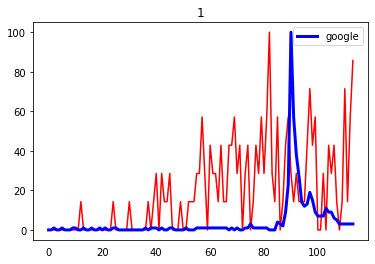

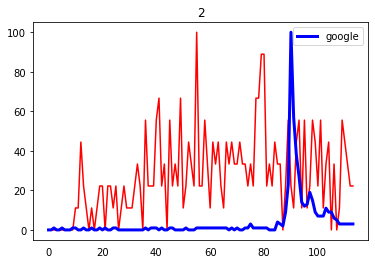

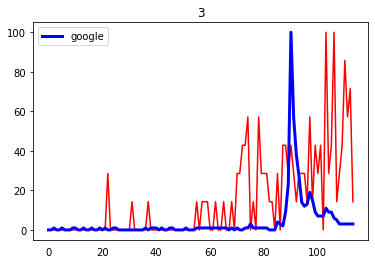

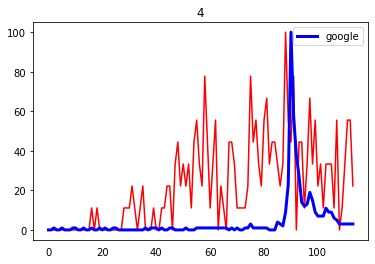

...

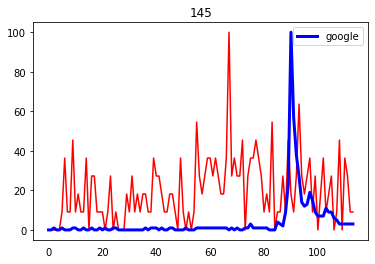

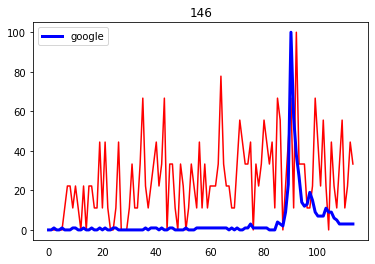

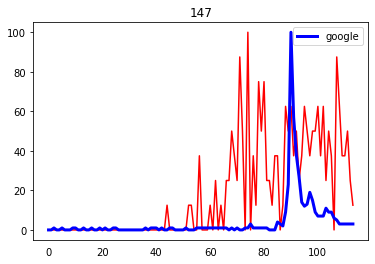

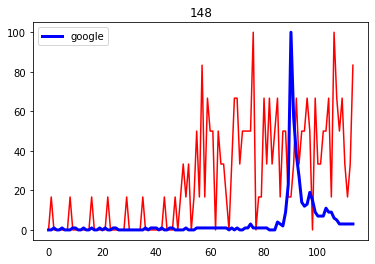

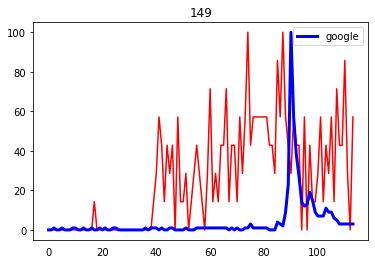

In [55]:
#lets look closer at our best results (median time = 82.5)

data_1= df.loc[df['ba-m']==3]
data_1=data_1.loc[data_1['simple-spread-chance']==0.05]
data_1=data_1.loc[data_1['cit-cit--influence']==0.1]
data_1=data_1.loc[data_1['cit-media-influence']==0.25]
print(data_1)

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')
    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i)
    plt.show()

       Unnamed: 0    run    n spread-type  simple-spread-chance  \
25594       25594  25594  300      simple                   0.1   
25595       25595  25595  300      simple                   0.1   
25596       25596  25596  300      simple                   0.1   
25597       25597  25597  300      simple                   0.1   
25598       25598  25598  300      simple                   0.1   
...           ...    ...  ...         ...                   ...   
25739       25739  25739  300      simple                   0.1   
25740       25740  25740  300      simple                   0.1   
25741       25741  25741  300      simple                   0.1   
25742       25742  25742  300      simple                   0.1   
25743       25743  25743  300      simple                   0.1   

            graph-type  ba-m  cit-media-influence  cit-cit--influence  \
25594  barabasi-albert     3                  0.5                0.25   
25595  barabasi-albert     3                  0.5

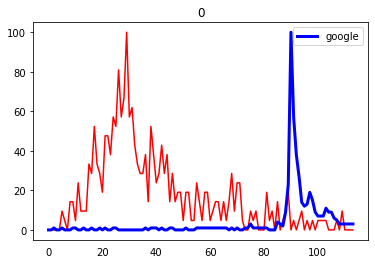

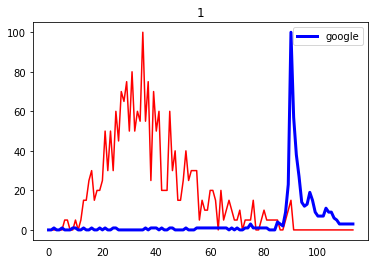

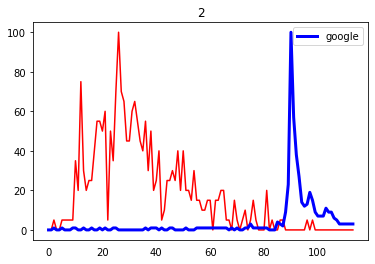

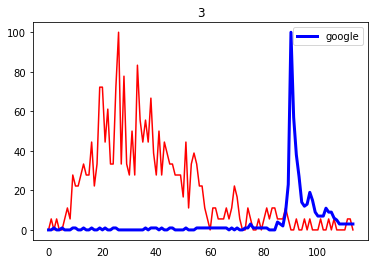

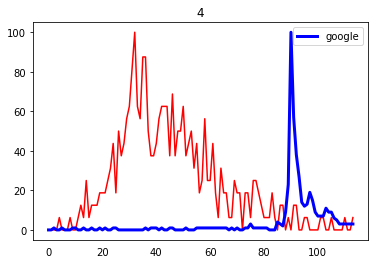

...

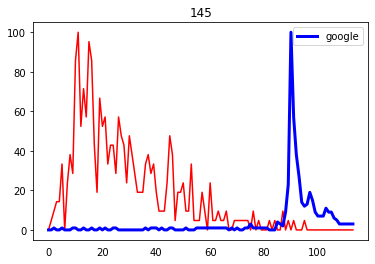

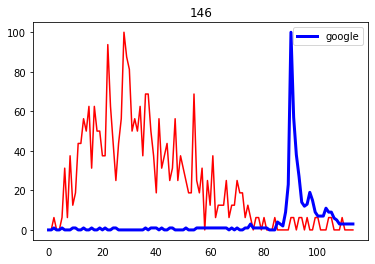

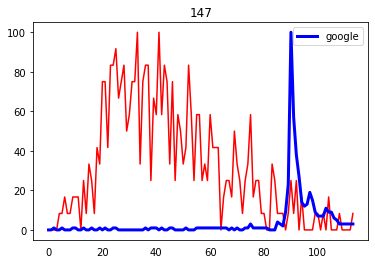

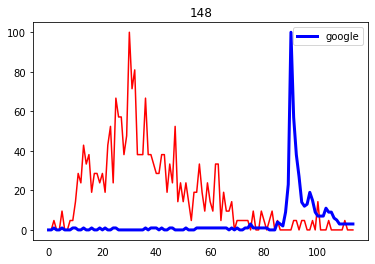

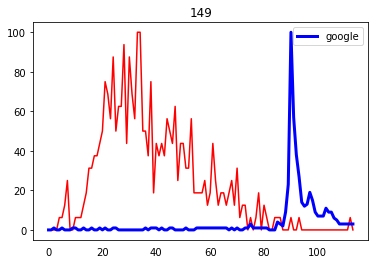

In [56]:
# interesting patter in 38- lets try that
data_1= df.loc[df['ba-m']==3]
data_1=data_1.loc[data_1['simple-spread-chance']==0.1]
data_1=data_1.loc[data_1['cit-cit--influence']==0.25]
data_1=data_1.loc[data_1['cit-media-influence']==0.5]
print(data_1)

for i in range(0, len(data_1)):
    data=data_1['short list'].iloc[i]
    data_list=data.strip('][').split(', ')
    new_list=[]
    for j in range(0, len(data_list)):
        item=float(data_list[j])
        new_list.append(item)
    val=i
    plt.tick_params(left=True, right=False, labelleft=True, labelbottom=True, bottom=False)
    plt.plot(time_list, new_list, color='red')
    plt.plot(time_list, goog_data, color='blue', lw=3, label="google")
    plt.legend()
    plt.title(i)
    plt.show()

In [72]:
#Lets make a figure that explore that
df = pd.read_csv("infl_mod_time_median.csv")
print(df)
df['bucket'] = None
for i in range(0 , len(df)):
    if df['peak-time'].iloc[i] < 10:
        df['bucket'].iloc[i] = 0
    if df['peak-time'].iloc[i] >= 10 and df['peak-time'].iloc[i] < 20:
        df['bucket'].iloc[i] = 10
    if df['peak-time'].iloc[i] >= 20 and df['peak-time'].iloc[i] < 30:
        df['bucket'].iloc[i] = 20
    if df['peak-time'].iloc[i] >= 30 and df['peak-time'].iloc[i] < 40:
        df['bucket'].iloc[i] = 30
    if df['peak-time'].iloc[i] >= 40 and df['peak-time'].iloc[i] < 50:
        df['bucket'].iloc[i] = 40
    if df['peak-time'].iloc[i] >= 50 and df['peak-time'].iloc[i] < 60:
        df['bucket'].iloc[i] = 50
    if df['peak-time'].iloc[i] >= 60 and df['peak-time'].iloc[i] < 70:
        df['bucket'].iloc[i] = 60
    if df['peak-time'].iloc[i] >= 70 and df['peak-time'].iloc[i] < 80:
        df['bucket'].iloc[i] = 70
    if df['peak-time'].iloc[i] >= 80 and df['peak-time'].iloc[i] < 90:
        df['bucket'].iloc[i] = 80

df.to_csv("scenarios_with_buckets.csv")

#there might be a better way to do this, but I need to manually count these

    
    


     Unnamed: 0  ba-m  simple-spread-chance  cit-cit--influence  \
0             0     3                  0.05                0.05   
1             1     3                  0.05                0.05   
2             2     3                  0.05                0.05   
3             3     3                  0.05                0.10   
4             4     3                  0.05                0.10   
..          ...   ...                   ...                 ...   
313         313    10                  0.75                0.75   
314         314    10                  0.75                0.75   
315         315    10                  0.75                0.75   
316         316    10                  0.75                0.75   
317         317    10                  0.75                0.75   

     cit-media-influence  peak-time  
0                   0.25       83.0  
1                   0.50       81.0  
2                   0.75       81.0  
3                   0.25       82.5  
4    

C:\Users\cknox02\Anaconda3\lib\site-packages\pandas\core\indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
